# Timothy Stevens

## Seller

Owns expensive houses in the center, needs to get rid, best timing within a year, open for renovation when profits rise

## Hypotheses

* Houses sold on spring made more profit, than any other season
* Houses sold after renovation has more profit at autumn or winter
* Renovated houses sold at autumn will make more profit, that non-renovated at spring


## 

# Data Preparation

In [19]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import missingno

import json


## prepare data

In [20]:
from Optional import preload_data, clean_data

csv_file_name = 'data/houses_sales.csv'
pkl_file_name = 'data/houses_sales.pkl'

preload_data(csv_file_name)
clean_data(csv_file_name, pkl_file_name)


## load data


In [21]:
df_sales = pd.read_pickle(pkl_file_name)

## prepare GeoJSON

In [22]:
from Optional import get_filtered_json

zipcodes_list = df_sales['zipcode'].unique()
zipcodes_geojson = 'data/seattle_zip_codes_geo.json'

get_filtered_json(zipcodes_geojson, zipcodes_list)

## load GeoJSON

In [23]:
zipcodes = {}
with open(zipcodes_geojson) as zips:
    zipcodes = json.load(zips)


What is our target houses? They are "expensive houses in the center". 

1. I want to find a center blocks as zip array.
2. I want to find a price range in this 'Kings County'. 
3. I want to be sure, that the more expensive prices are in the 'zip' list I've chosen

This would be nice as geo heat map

In [24]:
df_prices = df_sales[['house_id', 'zipcode',  'lat', 'long', 'yr_built', 'yr_renovated', 'sell_date', 'price']]


In [25]:
# def bar_price_graph(
#     dataframe,
#     title,
#     y_label,
#     x = list(),
#     y = dict(),
#     size = None):

#     columns = len(x)
#     lines = len(y)
#     show_labels = columns < 15

#     x_coords = list(range(columns))
#     width = 1 / (len(y) + 1)

#     fig, ax = plt.subplots(layout='constrained')
#     if size != None:
#         fig.set_size_inches(size)

#     for attr, measurement in y.items():
#         rects = ax.bar(x_coords, measurement, width, label = attr)
#         if show_labels:
#             ax.bar_label(rects, padding = 3)
    
#         for idx, val in enumerate(x_coords):
#             x_coords[idx] = val + width

#     ax.set_ylabel(y_label)
#     ax.set_title(title)
#     ax.set_xticks([ width + val for val in range(len(x))], x)
#     ax.legend(loc='upper right', ncols = lines)
#     ax.set_ylim(0, 9)
#     ax.tick_params(axis='x', labelrotation=45)

#     plt.show()

# def line_price_graph(
#     dataframe,
#     title,
#     y_label,
#     x = list(),
#     y = dict(),
#     x_label = '',
#     size = None):

#     show_labels = len(x) < 15

#     fig, ax = plt.subplots(layout='constrained')
#     if size != None:
#         fig.set_size_inches(size)

#     for lbl, values in y.items():
#         ax.plot(x, values, label=lbl)

#     ax.set_title(title)

#     ax.set_xlabel(x_label)
#     ax.set_ylabel(y_label)
#     if not show_labels:
#         ax.tick_params(axis="x", labelbottom=False)

#     ax.legend()
#     plt.show()

# def geo_price_graph(
#     dataframe,
#     title,
#     y_label,
#     y,
#     x = list(),
#     x_label = '',
#     size = (7,6)):

#     fig = px.choropleth_map(
#         data_frame = dataframe,
#         geojson = zipcodes,
#         locations = 'zipcode',
#         color = y,
#         range_color = (dataframe[y].min(), dataframe[y].max()),
#         featureidkey="properties.ZCTA5CE10",
#         labels={ y : y_label },
#         title=title,
#         width = size[0] * 96,
#         height = size[1] * 96,
#         center = { 'lat': 47.35, 'lon': -122 }
#     )
#     fig.update_geos(fitbounds="locations", visible=False)
#     fig.update_layout(
#         margin={
#             'r' : 0,
#             't' : 40,
#             'l' : 10,
#             'b' : 20,
#             'pad': 4,
#             'autoexpand': True
#         })
#     fig.show()

from Optional import bar_price_graph, line_price_graph, geo_price_graph

In [26]:
df_median_prices = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median')
).reset_index()

geo_price_graph(
    dataframe = df_median_prices,
    geodata = zipcodes,
    title = 'Median prices by zipcode areas',
    y_label = 'Mln $',
    x = 'zipcode',
    y = 'median_price')


In [27]:
df_max_prices = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    max_price = ('price', 'max')
).reset_index()

geo_price_graph(
    dataframe = df_max_prices,
    geodata = zipcodes,
    title = 'Maximal prices by zipcode areas',
    y_label = 'Mln $',
    x = 'zipcodes',
    y = 'max_price')


# who is more expensive?



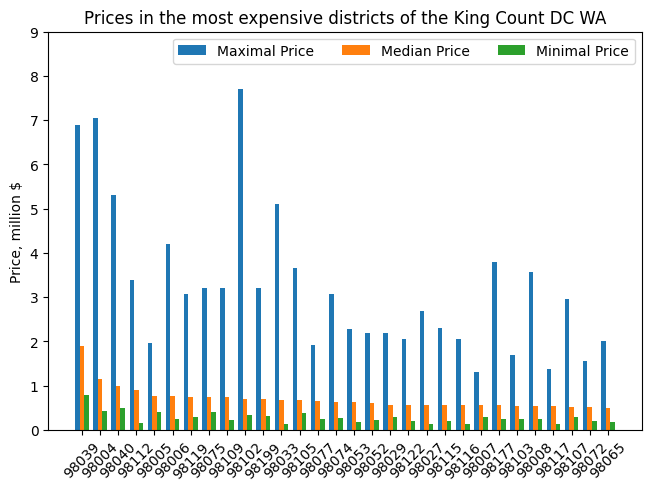

In [28]:
df_median_prices = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median'),
    max_price = ('price', 'max'),
    min_price = ('price', 'min'),
).reset_index()

df = df_median_prices.sort_values('median_price', ascending=False)[:30]

bar_price_graph(df_median_prices,
    title = 'Prices in the most expensive districts of the King Count DC WA',
    x = df.zipcode.to_list(),
    y = {
        'Maximal Price': df.max_price.to_list(),
        'Median Price': df.median_price.to_list(),
        'Minimal Price': df.min_price.to_list()
    },
    y_label = 'Price, million $')

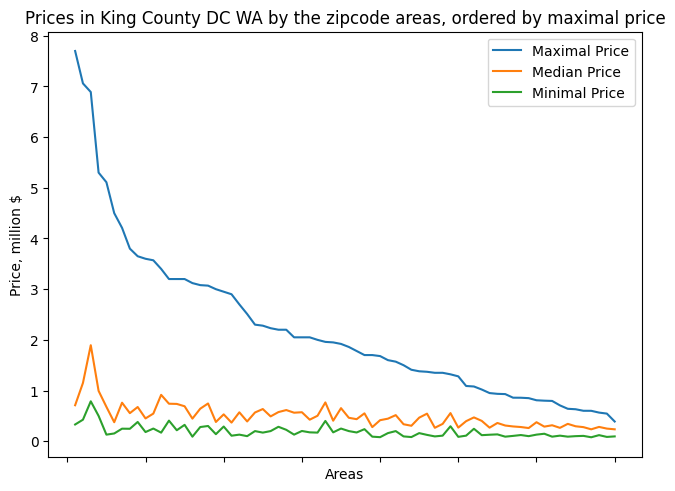

In [29]:
df = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median'),
    max_price = ('price', 'max'),
    min_price = ('price', 'min'),
).reset_index().sort_values('max_price', ascending = False)

line_price_graph(
    df,
    title = 'Prices in King County DC WA by the zipcode areas, ordered by maximal price',
    y_label = 'Price, million $',
    x_label = "Areas",
    x = list(range(1, df.shape[0] + 1) ),
    y = {
        'Maximal Price': df.max_price.to_list(),
        'Median Price': df.median_price.to_list(),
        'Minimal Price': df.min_price.to_list()
    })

# target_zipcodes = medians.reset_index()['zipcode'].head(6).to_list()


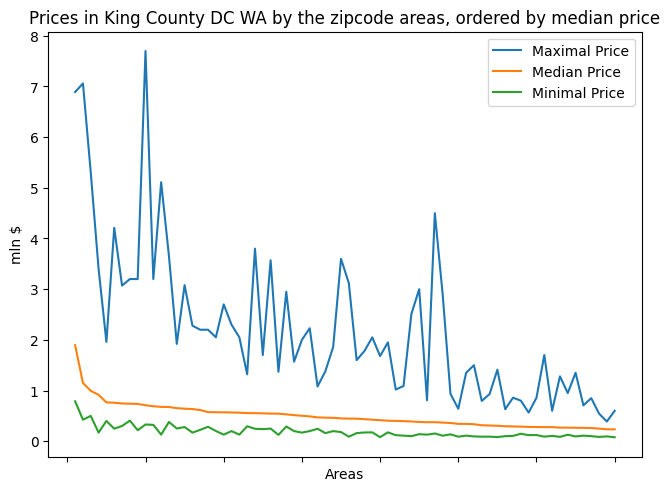

In [30]:
df = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median'),
    max_price = ('price', 'max'),
    min_price = ('price', 'min'),
).reset_index().sort_values('median_price', ascending = False)

line_price_graph(
    df,
    title = 'Prices in King County DC WA by the zipcode areas, ordered by median price',
    y_label = 'mln $',
    x_label = "Areas",
    x = list(range(1, df.shape[0] + 1) ),
    y = {
        'Maximal Price': df.max_price.to_list(),
        'Median Price': df.median_price.to_list(),
        'Minimal Price': df.min_price.to_list()
    })


In [31]:
selection_amount = 5

df_median = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median'),
    max_price = ('price', 'max'),
    min_price = ('price', 'min'),
).reset_index().sort_values('median_price', ascending = False)[:selection_amount]


df_max = df_prices[['zipcode', 'price']].groupby('zipcode').agg(
    median_price = ('price', 'median'),
    max_price = ('price', 'max'),
    min_price = ('price', 'min'),
).reset_index().sort_values('max_price', ascending = False)[:selection_amount]

print(df_median['zipcode'])
print(df_max['zipcode'])



df_selected = df_max.merge(df_median, on='zipcode', how='outer')
df_selected['median_price_x'] = df_selected['median_price_x'].fillna(df_selected['median_price_y'])
df_selected['max_price_x'] = df_selected['max_price_x'].fillna(df_selected['max_price_y'])
df_selected['min_price_x'] = df_selected['min_price_x'].fillna(df_selected['min_price_y'])

df_selected.drop(labels = ['max_price_y', 'median_price_y', 'min_price_y'], axis=1, inplace=True)

df_selected.rename(columns={
    'max_price_x': 'max_price',
    'median_price_x': 'median_price',
    'min_price_x': 'min_price'
}, inplace=True )

zipcodes_selected = df_selected.zipcode.to_list()


24    98039
3     98004
25    98040
48    98112
4     98005
Name: zipcode, dtype: int64
41    98102
3     98004
24    98039
25    98040
21    98033
Name: zipcode, dtype: int64


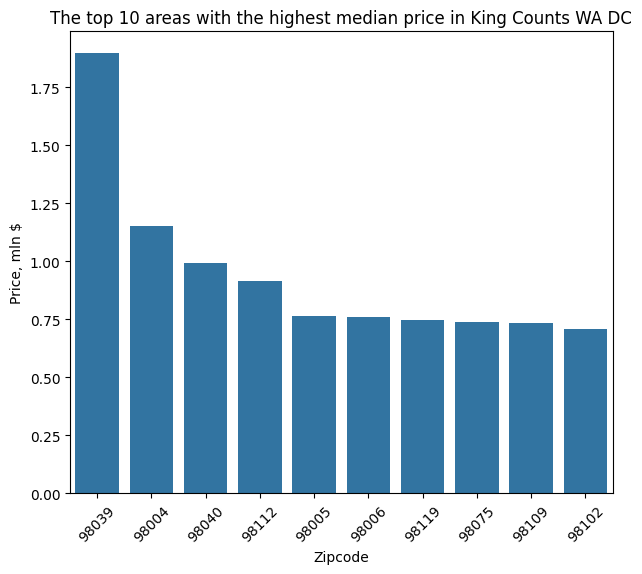

In [32]:
medians = df_prices.groupby('zipcode')['price'].median().reset_index(name='median_price')
df_top10 = medians.nlargest(10, 'median_price')

plt.figure(figsize=(7,6))
sns.barplot(
    x = 'zipcode',
    y = 'median_price',
    data = df_top10,
    order = df_top10.sort_values('median_price', ascending=False)['zipcode']
)
plt.title('The top 10 areas with the highest median price in King Counts WA DC')
plt.xlabel('Zipcode')
plt.ylabel('Price, mln $')
plt.xticks(rotation=45)
plt.show()


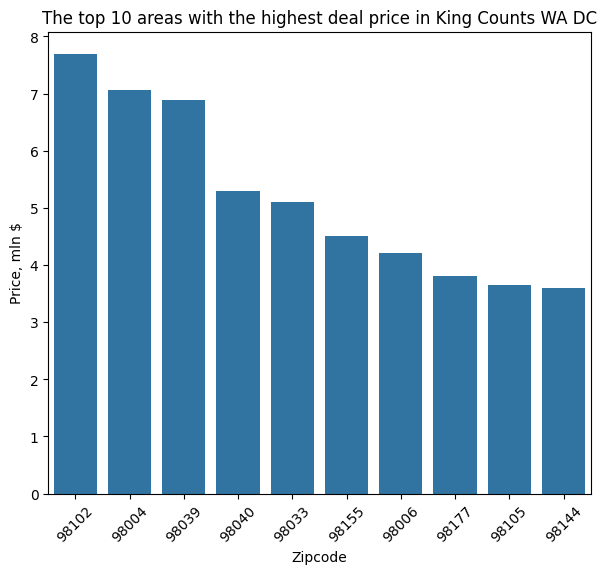

In [33]:
maxs = df_prices.groupby('zipcode')['price'].max().reset_index(name='max_price')
df_top10 = maxs.nlargest(10, 'max_price')

plt.figure(figsize=(7,6))
sns.barplot(
    x = 'zipcode',
    y = 'max_price',
    data = df_top10,
    order = df_top10.sort_values('max_price', ascending=False)['zipcode']
)
plt.title('The top 10 areas with the highest deal price in King Counts WA DC')
plt.xlabel('Zipcode')
plt.ylabel('Price, mln $')
plt.xticks(rotation=45)
plt.show()


In [34]:
l_selected_zipcodes = [98039, 98004, 98040]
d_zipcode_names = {
    98039 : 'Medine',
    98004 : 'Bellevue',
    98040 : 'Mercer Island'
}

In [35]:
df = df_prices.copy()

df['selected'] = df.apply(lambda code: code.zipcode in l_selected_zipcodes, axis = 1)

geo_price_graph(
    dataframe = df,
    geodata = zipcodes,
    title = 'Selected zipcode areas',
    y_label = '',
    x = 'zipcodes',
    y = 'selected')



In [36]:
# Deal, how the prices changes in
df_selected = df_sales.query(f'zipcode in {l_selected_zipcodes}')


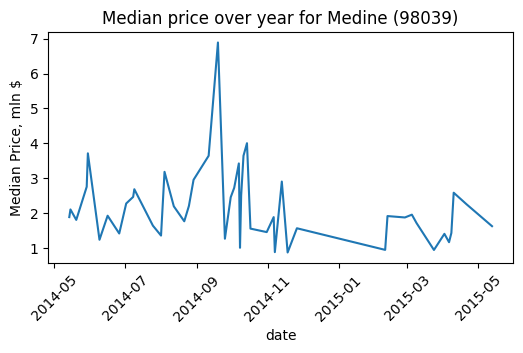

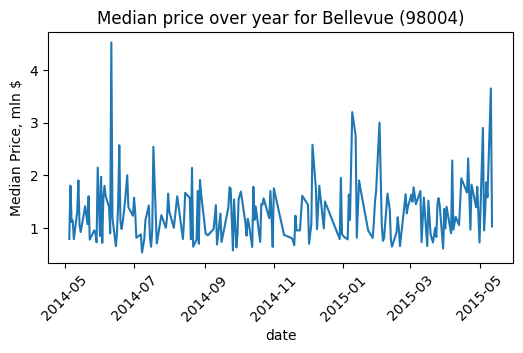

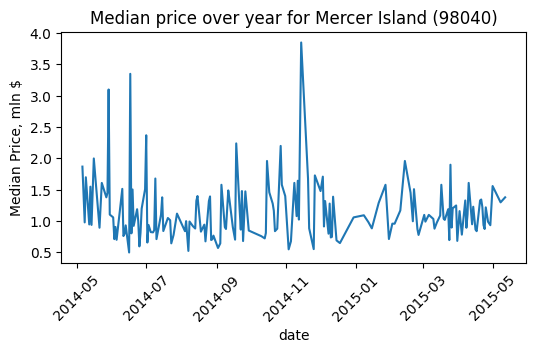

In [37]:
for zipcode in l_selected_zipcodes:
    df = df_sales.query(
            f'zipcode == {zipcode}'
        )[['sell_date', 'price']].groupby(
            'sell_date'
        ).agg(
            median_price = ('price', 'median'),
            max_price = ('price', 'max')
        ).reset_index().sort_values(by='sell_date')

    plt.figure(figsize=(6,3))
    sns.lineplot(
        data = df,
        x = 'sell_date',
        y = 'median_price',
    )
    plt.title(f'Median price over year for { d_zipcode_names[zipcode] } ({zipcode})')
    plt.xlabel('date')
    plt.ylabel('Median Price, mln $')
    plt.xticks(rotation=45)
    plt.show()


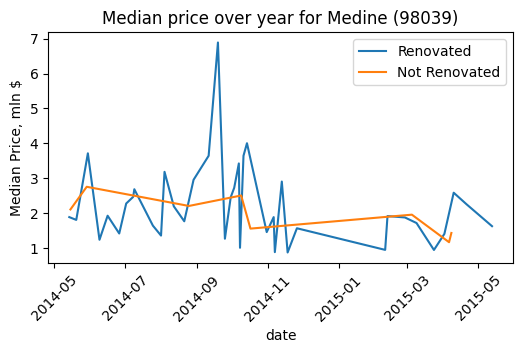

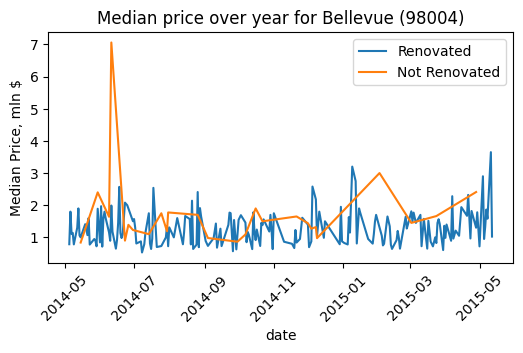

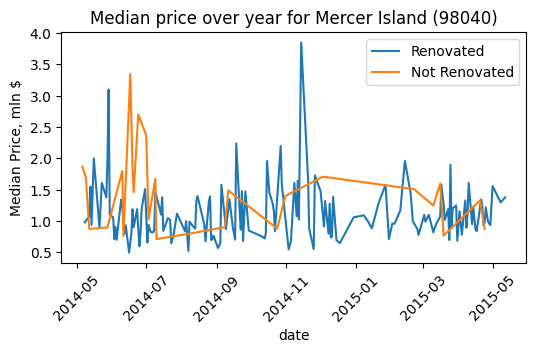

In [38]:
for zipcode in l_selected_zipcodes:
    df = df_sales.query(
            f'zipcode == {zipcode}'
        )[['sell_date', 'price', 'yr_renovated']]
    
    df['renovated'] = df['yr_renovated'].isna()
    
    df_renovated = df[df['renovated'] == True].groupby(
            'sell_date'
        )['price'].median().reset_index().sort_values(by='sell_date')

    df_not_renovated = df[df['renovated'] == False].groupby(
            'sell_date'
        )['price'].median().reset_index().sort_values(by='sell_date')


    plt.figure(figsize=(6,3))
    sns.lineplot(
        data = df_renovated,
        x = 'sell_date',
        y = 'price',
        label = "Renovated"
    )
    sns.lineplot(
        data = df_not_renovated,
        x = 'sell_date',
        y = 'price',
        label = "Not Renovated"
    )
    plt.title(f'Median price over year for { d_zipcode_names[zipcode] } ({zipcode})')
    plt.xlabel('date')
    plt.ylabel('Median Price, mln $')
    plt.xticks(rotation=45)
    plt.show()


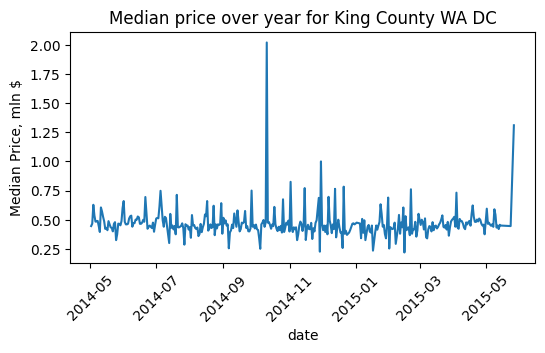

In [39]:
df = df_prices[['sell_date', 'price', 'yr_renovated']].copy()

df['renovated'] = df['yr_renovated'].isna()

df = df.groupby('sell_date')['price'].median().reset_index(name="median_price").sort_values(by='sell_date')

plt.figure(figsize=(6,3))
sns.lineplot(
    data = df,
    x = 'sell_date',
    y = 'median_price',
)
plt.title('Median price over year for King County WA DC')
plt.xlabel('date')
plt.ylabel('Median Price, mln $')
plt.xticks(rotation=45)
plt.show()


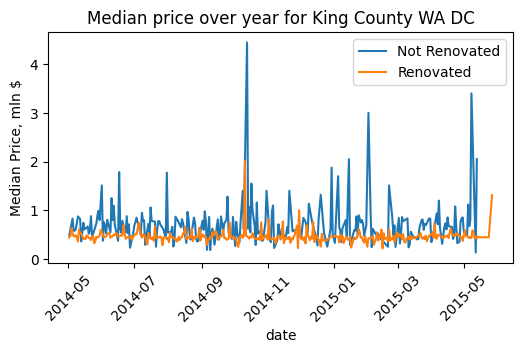

In [40]:
df = df_prices[['sell_date', 'price', 'yr_renovated']].copy()

df['renovated'] = df['yr_renovated'].isna()

df_renovated = df[df['renovated'] == True].groupby(
    'sell_date'
)['price'].median().reset_index().sort_values(by='sell_date')

df_not_renovated = df[df['renovated'] == False].groupby(
    'sell_date'
)['price'].median().reset_index().sort_values(by='sell_date')

plt.figure(figsize=(6,3))
sns.lineplot(
    data = df_not_renovated,
    x = 'sell_date',
    y = 'price',
    label = "Not Renovated"
)
sns.lineplot(
    data = df_renovated,
    x = 'sell_date',
    y = 'price',
    label = "Renovated"
)
plt.title(f'Median price over year for King County WA DC')
plt.xlabel('date')
plt.ylabel('Median Price, mln $')
plt.xticks(rotation=45)
plt.show()